## Exploratory Analysis and Visualization

### Importing necessary libraries

In [1]:
import pandas as pd
import json
import numpy as np
import os
import math
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas 
from collections import Counter
from PIL import Image
from tqdm import tqdm
from PIL import Image
from numpy import asarray
from tqdm import tqdm
from PIL import Image

### Data Preprocessing

In [2]:
df_list=[]
directory = 'annos'
item_per_sample = []
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".json"):
        loc=os.path.join(directory, filename)
        with open(loc,'r') as myfile:
            data=myfile.read()
        obj=json.loads(data)
        pair_id=obj['pair_id']
        source=obj['source']
        keys_obj = obj.keys()
        filtered_items = [item for item in keys_obj if item.startswith('item')] 
        i = 1
        item_counter = 0
        while(i<=len(filtered_items)):
            try:
                clothing=obj['item{}'.format(str(i))]['category_name']
                bounding_box_vals=obj['item{}'.format(str(i))]['bounding_box']
                scale=obj['item{}'.format(str(i))]['scale']
                viewpoint=obj['item{}'.format(str(i))]['viewpoint']
                zoom=obj['item{}'.format(str(i))]['zoom_in']
                occlusion=obj['item{}'.format(str(i))]['occlusion']
                df_list.append([filename, pair_id, source, clothing, bounding_box_vals, scale, viewpoint, zoom, occlusion])
                item_counter+=1
                i+=1
            except:
                break
        item_per_sample.append(item_counter)

In [3]:
directory = 'image'
res_list=[]
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".jpg"):
        loc = directory + "/" + filename
        img = Image.open(loc)        
        res_list.append([str(img.size[0]) + "x" + str(img.size[1])])
        img.close()
df = pd.DataFrame(res_list, columns=['res'])

In [4]:
tres = df.res.value_counts().rename_axis('res').reset_index(name='count')
tres = tres[tres['count'] > 500]

In [5]:
df_list1 = []
directory = 'annos'
item_per_sample = []
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".json"):
        loc=os.path.join(directory, filename)
        with open(loc,'r') as myfile:
            data=myfile.read()
        obj=json.loads(data)
        pair_id=obj['pair_id']
        source=obj['source']
        keys_obj = obj.keys()
        filtered_items = [item for item in keys_obj if item.startswith('item')]   
        i = 1
        item_counter = 0
        while(i<=len(filtered_items)):
            try:
                bounding_box_vals=obj['item{}'.format(str(i))]['bounding_box']
                area = (bounding_box_vals[2]-bounding_box_vals[0])*(bounding_box_vals[3]-bounding_box_vals[1])
                df_list1.append([area])
                item_counter+=1
                i+=1
            except:
                break
        item_per_sample.append(item_counter)

### Histogram of size of images

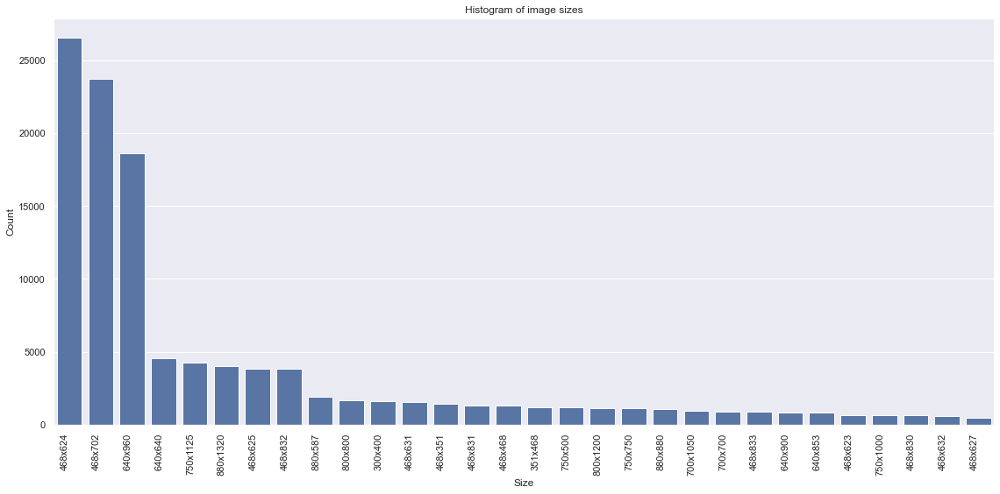

In [6]:
fig=plt.figure(figsize=(16,8))
sns.set(rc={'figure.facecolor':'white'})
ax=sns.barplot(x="res", y = "count",data=tres,color='b')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
ax.set(xlabel='Size', ylabel='Count')
plt.title('Histogram of image sizes')
plt.tight_layout()

### Analyzing the number of images per image

#### Histogram for number of items per image 

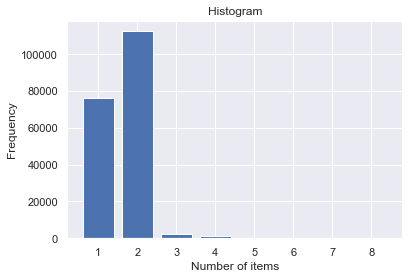

In [7]:
a_dictionary = Counter(item_per_sample)
keys = a_dictionary.keys()
values = a_dictionary.values()
plt.title('Histogram')
plt.bar(keys, values)
plt.xlabel('Number of items')
plt.ylabel('Frequency')
plt.show()

#### Histogram for number of items per image using a log scale

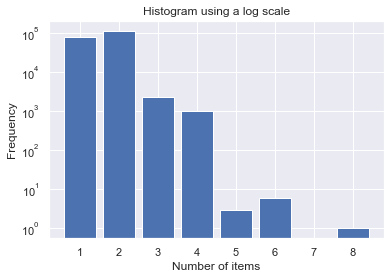

In [8]:
a_dictionary = Counter(item_per_sample)
keys = a_dictionary.keys()
values = a_dictionary.values()
plt.bar(keys, values)
plt.xlabel('Number of items')
plt.ylabel('Frequency')
plt.title('Histogram using a log scale')
plt.yscale('log')

### Pie chart of sources

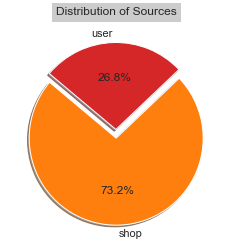

In [9]:
df = pd.DataFrame(df_list, columns=['filename', 'Pair Id', 'Source', 'Clothing','Box',
                                    'scale','viewpoint','zoom','occlusion'])
values=list(df.Source.value_counts().values)
labels=df.Source.unique()
colors = ["#ff7f0e", "#d62728"]
# explode 1st slice
explode = (0.1, 0)  
# Plot
plt.pie(values, explode=explode, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=True, startangle=140, radius=1)
plt.title("Distribution of Sources", bbox={'facecolor':'0.8', 'pad':5})
plt.show()

### Analyzing of bounding box dimension

#### Pie chart of bounding box area

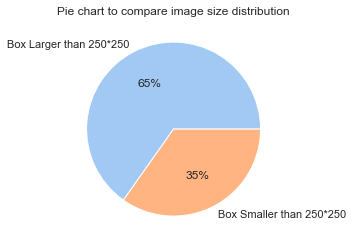

In [10]:
df_bounding = pd.DataFrame(df_list1, columns=['Box Area'])
proportion = len([i[0] for i in df_list1 if i[0] > 62500])/len(df_list1)
data = [proportion, 1-proportion]
labels = ['Box Larger than 250*250', 'Box Smaller than 250*250']

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Pie chart to compare image size distribution')
plt.show()

#### Histogram of area covered by bounding box

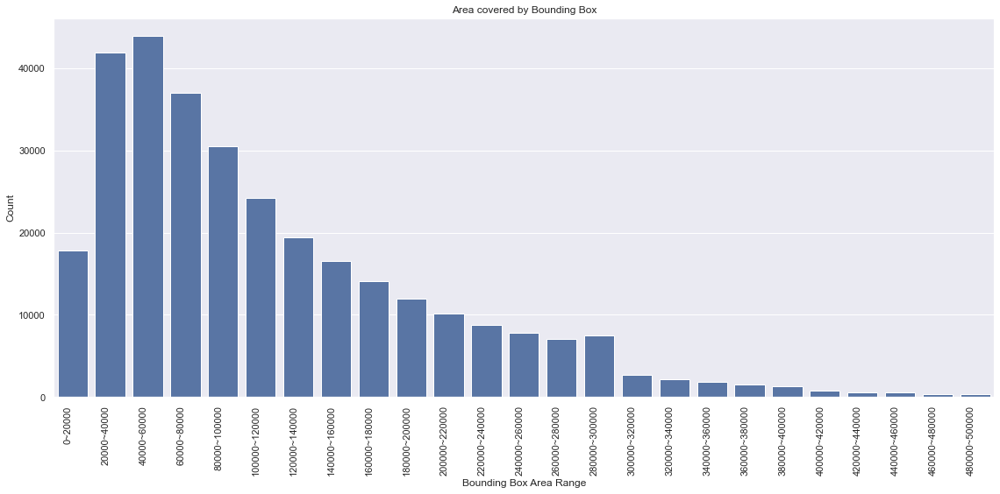

In [11]:
sorted_size = df_bounding['Box Area'].to_list()
sorted_size.sort()
n=20000
#chunks = [sorted_size[x:x+n] for x in range(0, len(sorted_size), n)]
box_count_list = []
chunks = []
currGroup = []
threshold = n
for num in sorted_size:
    if num > threshold:
        chunks.append(currGroup)
        currGroup = [num]
        threshold = threshold + n
    else:
        currGroup.append(num)
chunks.append(currGroup)
    
for i in range(0,len(chunks)):
    count = len(chunks[i])
    rangeStr = str(n*i) + "~" + str(n*(i+1))
    box_count_list.append([rangeStr,count])
df_boundingCount = pd.DataFrame(box_count_list, columns=['Bounding Box Area Range','count'])
df_boundingCount = df_boundingCount.loc[df_boundingCount['count'] >= 300]
fig=plt.figure(figsize=(16,8))
sns.set(rc={'figure.facecolor':'white'})
ax=sns.barplot(x="Bounding Box Area Range", y = "count",data=df_boundingCount,color='b')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
ax.set(xlabel='Bounding Box Area Range', ylabel='Count')
plt.title('Area covered by Bounding Box')
plt.tight_layout()

#### Histogram of image height distribution

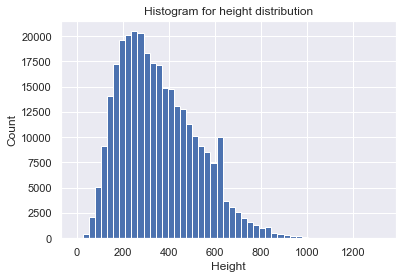

In [12]:
df["height"] = df["Box"].apply(lambda l: l[3]-l[1])
df["width"] = df["Box"].apply(lambda l: l[2]-l[0])
df["height"].hist(bins = 50)
plt.title('Histogram for height distribution')
plt.xlabel('Height')
plt.ylabel('Count')
plt.show()

#### Scatter plot of image dimensions

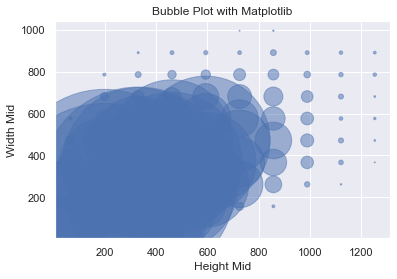

In [13]:
df["height_grouped"] = pd.cut(df["height"],10)
df["width_grouped"] = pd.cut(df["width"],10)
df["height_mid"] = df.apply(lambda row: row["height_grouped"].left + ((row["height_grouped"].right - row["height_grouped"].left)/2), axis=1)
df["width_mid"] = df.apply(lambda row: row["width_grouped"].left + ((row["width_grouped"].right - row["width_grouped"].left)/2), axis=1)
sizes_hwmid = df.groupby(['height_mid', 'width_mid']).size().reset_index().rename(columns={0:'count'})
plt.scatter('height_mid', 'width_mid', 
             s='count',
             alpha=0.5, 
             data=sizes_hwmid)
plt.xlabel("Height Mid")
plt.ylabel("Width Mid")
plt.title("Bubble Plot with Matplotlib")
plt.show()

The above image is not very clear which is why we use seaborn's scatter plot function to build the bubble map

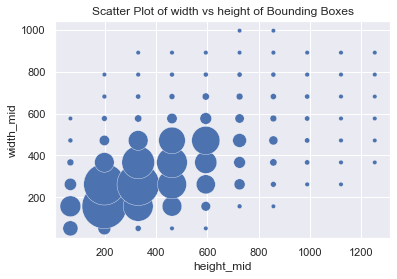

In [14]:
sns.set_theme()
sns.scatterplot(data=sizes_hwmid, x='height_mid', y='width_mid', size="count", legend=False, sizes=(20, 2000))
plt.title("Scatter Plot of width vs height of Bounding Boxes")
# show the graph
plt.show()

#### Interactive scatter plot for the same

In [16]:
# dim_df = pd.DataFrame(dims, columns=['height', 'width'])
sizes_hwmid.hvplot.scatter(x='height_mid', y='width_mid', size='count', xlim=(0,1200), ylim=(0,1200), grid=True, xticks=2, 
        yticks=2, height=500, width=600).options(scaling_factor=0.1, line_alpha=1, fill_alpha=0, title="Scatter Plot of width vs height of Bounding Boxes")


:Scatter   [height_mid]   (width_mid,count)

### Analyzing the width and height of bounding box for upper and lower half clothes

#### Scatter Plot of dimensions colored by category

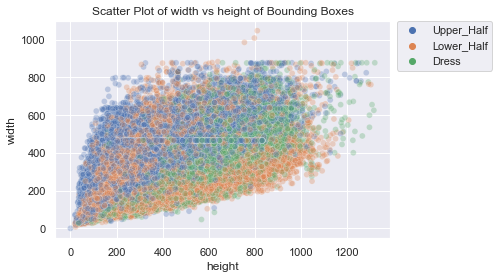

In [17]:
upper_half = ["short sleeve top", "long sleeve top", "vest", "long sleeve outwear", "sling", "short sleeve outwear"]
lower_half = ["trousers", "shorts", "skirt"]
dress = ["vest dress", "short sleeve dress", "long sleeve dress", "sling dress"]
def label_grouping(row):
    clothing_label = row["Clothing"]
    if clothing_label in  upper_half :
        return 'Upper_Half'
    if clothing_label in  lower_half :
        return 'Lower_Half'
    else:
        return 'Dress'
df["grouped_clothing"] = df.apply(lambda row: label_grouping(row), axis=1)
df_upper_half = df[df["grouped_clothing"] == "Upper_Half"]
df_lower_half = df[df["grouped_clothing"] == "Lower_Half"]
df_dress = df[df["grouped_clothing"] == "Dress"]
sns.scatterplot(data=df, x='height', y='width', hue="grouped_clothing", legend=True, sizes=(20, 2000), alpha=0.3)
plt.title("Scatter Plot of width vs height of Bounding Boxes")

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()


#### Interactive scatter plot for the same

In [18]:
df.hvplot.scatter(x='height', y='width', by='grouped_clothing', xlim=(0,1200), ylim=(0,1200), grid=True, xticks=2, 
        yticks=2, height=500, width=600).options(title="Scatter Plot of width vs height of Bounding Boxes")

:NdOverlay   [grouped_clothing]
   :Scatter   [height]   (width)

### Analyzing image properties

#### Pie chart for image properties- scale, viewpoint, zoom, occlusion

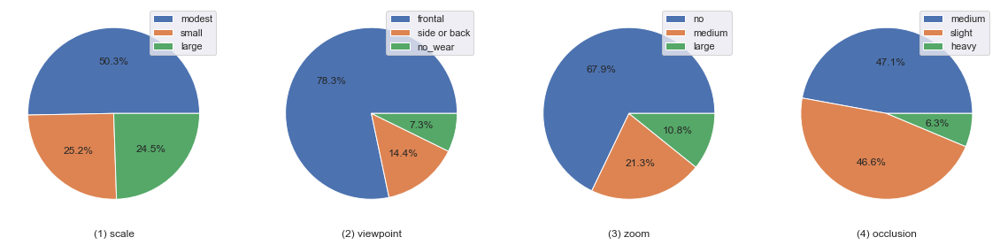

In [19]:
df1 = pd.DataFrame(df_list, columns=['filename', 'Pair Id', 'Source', 'Clothing','Box','scale','viewpoint','zoom','occlusion'])
df1.set_index('filename',inplace=True)
cat_features = ['scale','viewpoint','zoom','occlusion']
labels = [['modest', 'small', 'large'],
         ['frontal','side or back','no_wear'],
         ['no','medium','large'],
         ['medium','slight','heavy']]

fig, ax = plt.subplots(1,4,figsize=(20,6))

for idx, var in enumerate(zip(cat_features, ax.flatten())):
    var[1].pie(df1[var[0]].value_counts().values, autopct='%1.1f%%')
    var[1].set_title("("+ str(idx+1) + ") "+var[0], y = -0.1)
    var[1].legend(labels[idx], loc="upper right")
    
plt.show()

### Clothing type distribution analysis

#### Histogram for clothing types

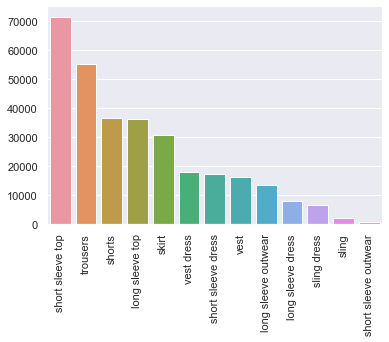

In [21]:
finalcount = df1['Clothing'].value_counts()
finalcount=finalcount.sort_values(ascending=False)
sns.barplot(y=finalcount.values, x= finalcount.index, order = finalcount.index)
plt.xticks(rotation=90)
plt.show()

### Image color analysis

In [ ]:
location = './train/image/'
images = df['img_name'].values
reds = np.zeros(images.shape[0])
greens = np.zeros(images.shape[0])
blues = np.zeros(images.shape[0])
mean = np.zeros(images.shape[0])
for i, path in enumerate(tqdm(images)):
    img = np.array(Image.open(os.path.join(location, f'{path}')))
    reds[i] = np.mean(img[:,:,0].ravel())
    greens[i] = np.mean(img[:,:,1].ravel())
    blues[i] = np.mean(img[:,:,2].ravel())
    mean[i] = np.mean(img)

data['reds'] = reds
data['greens'] = greens
data['blues'] = blues
data['mean_colors'] = mean


100%|████████████████████████████████████████████████████| 312186/312186 [34:05<00:00, 152.59it/s]


/Users/apeile/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/apeile/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/apeile/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar 

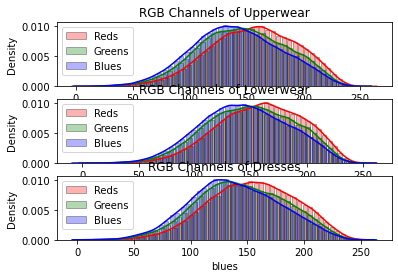

In [ ]:
# Creating a customized chart and giving in figsize etc.

fig, axs = plt.subplots(3,1)


# Customizing the first grid.

ax1 = axs[0]

# Set the title.

ax1.set_title('RGB Channels of Upperwear')

# Plot.

sns.distplot(df[df['type'] == 0].reds,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='red',
             kde=True,
             ax=ax1,
             label='Reds')
sns.distplot(df[df['type'] == 0].greens,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='green',
             kde=True,
             ax=ax1,
             label='Greens')
sns.distplot(df[df['type'] == 0].blues,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='blue',
             kde=True,
             ax=ax1,
             label='Blues')

ax1.legend()

# Customizing the second grid.

ax2 = axs[1]

# Set the title.

ax2.set_title('RGB Channels of Lowerwear')

# Plot

sns.distplot(df[df['type'] == 1].reds,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='red',
             kde=True,
             ax=ax2,
             label='Reds')
sns.distplot(df[df['type'] == 1].greens,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='green',
             kde=True,
             ax=ax2,
             label='Greens')
sns.distplot(df[df['type'] == 1].blues,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='blue',
             kde=True,
             ax=ax2,
             label='Blues')
ax2.legend()

ax3 = axs[2]

# Set the title.

ax3.set_title('RGB Channels of Dresses')

# Plot

sns.distplot(df[df['type'] == 2].reds,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='red',
             kde=True,
             ax=ax3,
             label='Reds')
sns.distplot(df[df['type'] == 2].greens,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='green',
             kde=True,
             ax=ax3,
             label='Greens')
sns.distplot(df[df['type'] == 2].blues,
             hist_kws={
                 'rwidth': 0.75,
                 'edgecolor': 'black',
                 'alpha': 0.3
             },
             color='blue',
             kde=True,
             ax=ax3,
             label='Blues')
ax3.legend()

plt.show()